# 计算新闻传播学 HOMEWORK4
***
## 王凯伦  15210130081

# Bag-of-words model
***
# 词袋模型
### 词文本矩阵：使用词向量表达文本次数，但忽略了词的顺序

In [1]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
count = CountVectorizer()
docs = np.array([
        'The sun is shining',
        'The weather is sweet',
        'The sun is shining and the weather is sweet'])
bag = count.fit_transform(docs)

In [6]:
'  '.join(dir(count)) 

'__class__  __delattr__  __dict__  __doc__  __format__  __getattribute__  __hash__  __init__  __module__  __new__  __reduce__  __reduce_ex__  __repr__  __setattr__  __sizeof__  __str__  __subclasshook__  __weakref__  _char_ngrams  _char_wb_ngrams  _check_vocabulary  _count_vocab  _get_param_names  _limit_features  _sort_features  _validate_vocabulary  _white_spaces  _word_ngrams  analyzer  binary  build_analyzer  build_preprocessor  build_tokenizer  decode  decode_error  dtype  encoding  fit  fit_transform  fixed_vocabulary  fixed_vocabulary_  get_feature_names  get_params  get_stop_words  input  inverse_transform  lowercase  max_df  max_features  min_df  ngram_range  preprocessor  set_params  stop_words  stop_words_  strip_accents  token_pattern  tokenizer  transform  vocabulary  vocabulary_'

In [7]:
count.get_feature_names()

[u'and', u'is', u'shining', u'sun', u'sweet', u'the', u'weather']

In [8]:
print(count.vocabulary_)

{u'and': 0, u'weather': 6, u'sweet': 4, u'sun': 3, u'is': 1, u'the': 5, u'shining': 2}


In [9]:
type(bag)
# 一个稀疏的矩阵

scipy.sparse.csr.csr_matrix

In [10]:
print(bag.toarray())

[[0 1 1 1 0 1 0]
 [0 1 0 0 1 1 1]
 [1 2 1 1 1 2 1]]


In [11]:
import pandas as pd
pd.DataFrame(bag.toarray(), columns = count.get_feature_names())

,and,is,shining,sun,sweet,the,weather
0,0,1,1,1,0,1,0
1,0,1,0,0,1,1,1
2,1,2,1,1,1,2,1


# TF-IDF

In [12]:
np.set_printoptions(precision=2)

In [13]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf = TfidfTransformer(use_idf=True, norm='l2', smooth_idf=True)
print(tfidf.fit_transform(count.fit_transform(docs)).toarray())


[[ 0.    0.43  0.56  0.56  0.    0.43  0.  ]
 [ 0.    0.43  0.    0.    0.56  0.43  0.56]
 [ 0.4   0.48  0.31  0.31  0.31  0.48  0.31]]


In [14]:
bag = tfidf.fit_transform(count.fit_transform(docs))
pd.DataFrame(bag.toarray(), columns = count.get_feature_names())

,and,is,shining,sun,sweet,the,weather
0,0.000000,0.433708,0.558478,0.558478,0.000000,0.433708,0.000000
1,0.000000,0.433708,0.000000,0.000000,0.558478,0.433708,0.558478
2,0.404748,0.478102,0.307822,0.307822,0.307822,0.478102,0.307822


In [15]:
# 一个词的tfidf值
tf_is = 2 
n_docs = 3
idf_is = np.log((n_docs+1) / (3+1))
tfidf_is = tf_is * (idf_is + 1)
print('tf-idf of term "is" = %.2f' % tfidf_is)

tf-idf of term "is" = 2.00


In [16]:
# 最后一个文本里的词的tfidf原始数值（未标准化）
tfidf = TfidfTransformer(use_idf=True, norm=None, smooth_idf=True)
raw_tfidf = tfidf.fit_transform(count.fit_transform(docs)).toarray()[-1]
raw_tfidf 

array([ 1.69,  2.  ,  1.29,  1.29,  1.29,  2.  ,  1.29])

In [17]:
# l2标准化后的tfidf数值
l2_tfidf = raw_tfidf / np.sqrt(np.sum(raw_tfidf**2))
l2_tfidf

array([ 0.4 ,  0.48,  0.31,  0.31,  0.31,  0.48,  0.31])

# 政府工作报告文本挖掘

In [5]:
with open('C:/Program Files/cjc2016/data/gov_reports1954-2016.txt', 'r') as f:
    reports = f.readlines()

In [6]:
len(reports)

47

In [7]:
print reports[32][:1000]

2002	2002年政府工作报告　　——2002年3月5日在第九届全国人民代表大会第五次会议上		　　　　　　　　　　　　　　　　　　 国务院总理朱镕基　  各位代表：　　现在，我代表国务院向大会作政府工作报告，请予审议，并请全国政协各位委员提出意见。　　首先报告２００１年的工作。　　新世纪第一年，全国各族人民在中国共产党领导下，面对复杂多变的国际形势，克服困难，阔步前进，改革开放和社会主义现代化建设取得了新的重大成就。　　国民经济保持良好发展势头。在世界经济增长明显减速的情况下，我们坚持扩大内需的方针，坚定地实施积极的财政政策和稳健的货币政策，实现了经济较快增长。２００１年国内生产总值达到９５９３３亿元，比上年增长７．３％。经济结构调整取得积极进展。农业结构有所优化，优质、专


In [1]:
%matplotlib inline
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import sys 
import numpy as np
from collections import defaultdict
import statsmodels.api as sm
from wordcloud import WordCloud
import jieba
import matplotlib
import gensim
from gensim import corpora, models, similarities
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
matplotlib.rcParams['font.sans-serif'] = ['Microsoft YaHei'] #指定默认字体 
matplotlib.rc("savefig", dpi=400)

># 1. 分词

In [82]:
import jieba

seg_list = jieba.cut("我来到北京清华大学", cut_all=True)
print("Full Mode: " + "/ ".join(seg_list))  # 全模式

seg_list = jieba.cut("我来到北京清华大学", cut_all=False)
print("Default Mode: " + "/ ".join(seg_list))  # 精确模式

seg_list = jieba.cut("他来到了网易杭研大厦")  # 默认是精确模式
print(", ".join(seg_list))

seg_list = jieba.cut_for_search("小明硕士毕业于中国科学院计算所，后在日本京都大学深造")  # 搜索引擎模式
print(", ".join(seg_list))

seg_list = jieba.cut("小明硕士毕业于中国科学院计算所，后在日本京都大学深造") 
print(", ".join(seg_list))

Full Mode: 我/ 来到/ 北京/ 清华/ 清华大学/ 华大/ 大学
Default Mode: 我/ 来到/ 北京/ 清华大学
他, 来到, 了, 网易, 杭研, 大厦
小明, 硕士, 毕业, 于, 中国, 科学, 学院, 科学院, 中国科学院, 计算, 计算所, ，, 后, 在, 日本, 京都, 大学, 日本京都大学, 深造
小明, 硕士, 毕业, 于, 中国科学院, 计算所, ，, 后, 在, 日本京都大学, 深造


># 2. 停用词

In [2]:
filename = 'C:/Program Files/cjc2016/data/stopwords.txt'
stopwords = {}
f = open(filename, 'r')
line = f.readline().rstrip()
while line:
    stopwords.setdefault(line, 0)
    stopwords[line.decode('utf-8')] = 1
    line = f.readline().rstrip()
f.close()

In [3]:
adding_stopwords = [u'我们', u'要', u'地', u'有', u'这', u'人',
                    u'发展',u'建设',u'加强',u'继续',u'对',u'等',u'推进',u'工作',u'增加']
for s in adding_stopwords: stopwords[s]=10

># 3. 关键词抽取

### 基于TF-IDF 算法的关键词抽取

In [8]:
import jieba.analyse
txt = reports[-1]
tf = jieba.analyse.extract_tags(txt, topK=200, withWeight=True)

Building prefix dict from the default dictionary ...
Dumping model to file cache c:\users\admini~1\appdata\local\temp\jieba.cache
Loading model cost 5.054 seconds.
Prefix dict has been built succesfully.


In [9]:
print u"、".join([i[0] for i in tf[:50]])

发展、推进、改革、建设、创新、加快、经济、加强、促进、实施、政府、推动、完善、政策、全面、增长、社会、就业、企业、提高、创业、扩大、制度、坚持、一批、深化、人民、落实、支持、农村、试点、实现、安全、合作、工作、我国、动能、机制、加大、服务业、城镇、我们、服务、取得、依法、积极、中国、深入、结构性、民生


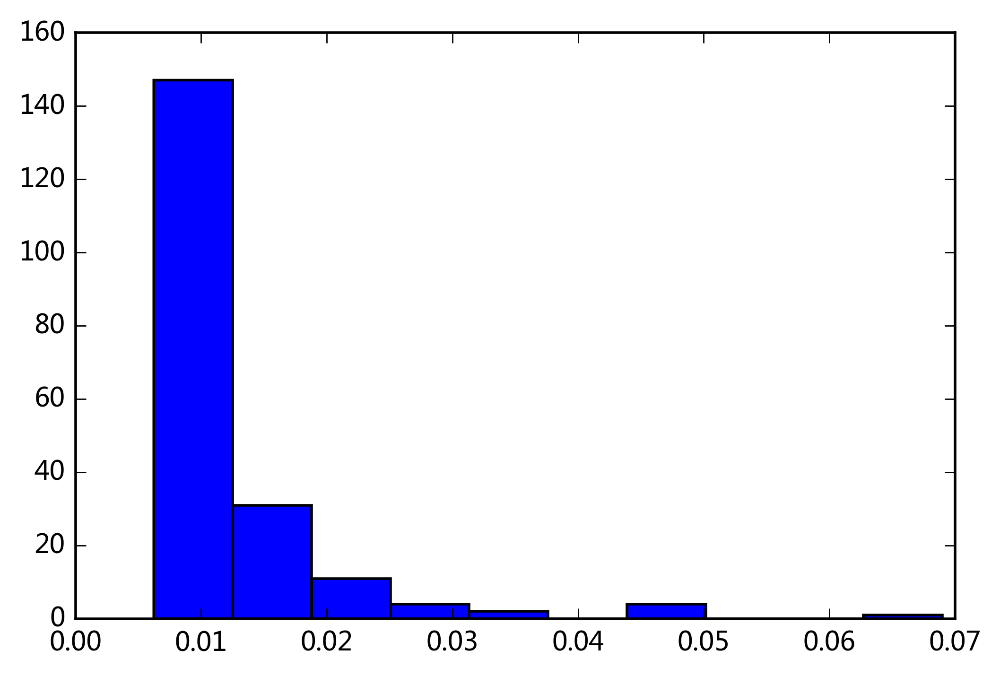

In [10]:
plt.hist([i[1] for i in tf])
plt.show()

### 基于 TextRank 算法的关键词抽取

### 语义网络

In [11]:
tr = jieba.analyse.textrank(txt,topK=200, withWeight=True)
print u"、".join([i[0] for i in tr[:50]])

发展、建设、经济、改革、推进、创新、加强、加快、政府、推动、促进、实施、企业、政策、社会、制度、中国、提高、完善、全面、增长、扩大、支持、实现、工作、机制、人民、创业、服务、农村、试点、地方、坚持、国家、国际、继续、就业、合作、基本、加大、农业、投资、保护、问题、地区、依法、工程、取得、鼓励、建立


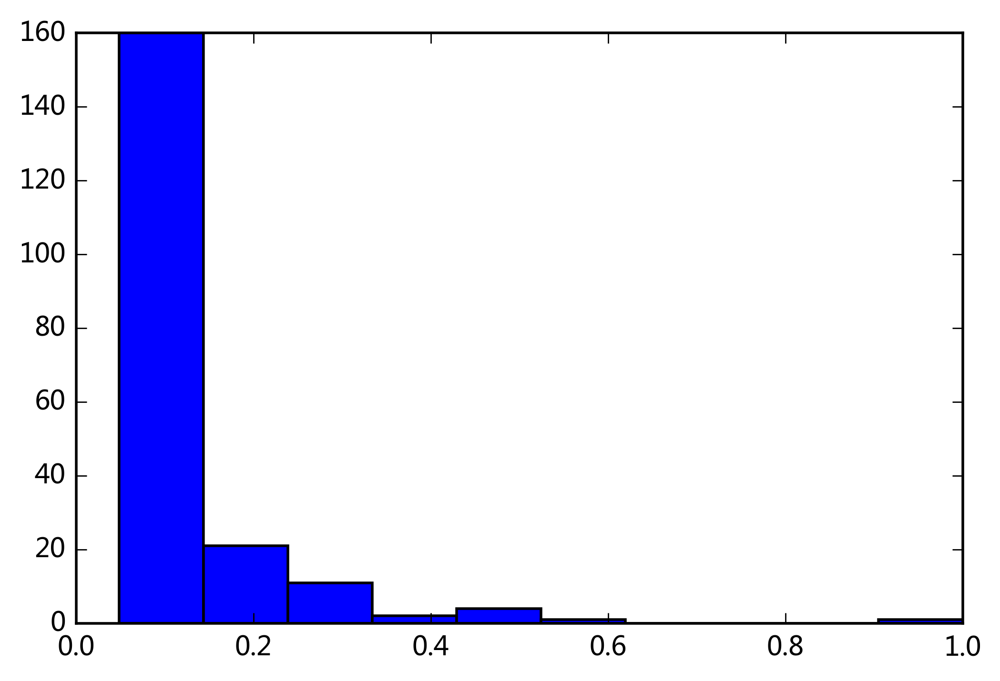

In [12]:
plt.hist([i[1] for i in tr])
plt.show()

In [13]:
import pandas as pd

def keywords(index):
    txt = reports[-index]
    tf = jieba.analyse.extract_tags(txt, topK=200, withWeight=True)
    tr = jieba.analyse.textrank(txt,topK=200, withWeight=True)
    tfdata = pd.DataFrame(tf, columns=['word', 'tfidf'])
    trdata = pd.DataFrame(tr, columns=['word', 'textrank'])
    worddata = pd.merge(tfdata, trdata, on='word')
    plt.plot(worddata.tfidf, worddata.textrank, linestyle='',marker='.')
    for i in range(len(worddata.word)):
        plt.text(worddata.tfidf[i], worddata.textrank[i], worddata.word[i], 
                 fontsize = worddata.textrank[i]*15, color = 'red', rotation = 0)
    plt.title(txt[:4])
    plt.xlabel('Tf-Idf')
    plt.ylabel('TextRank')
    plt.show()

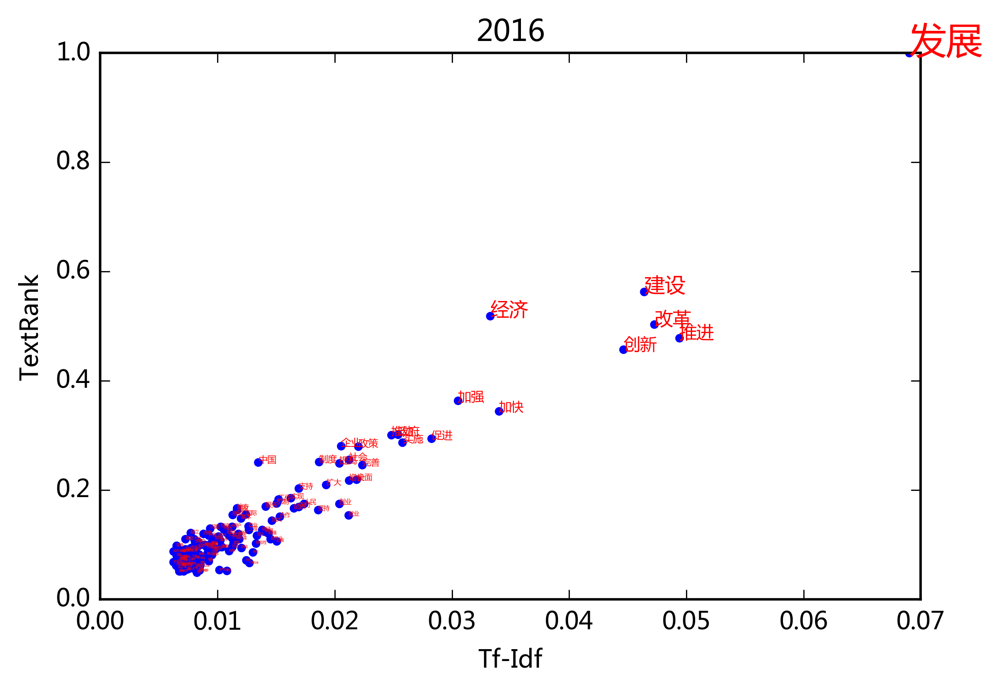

In [16]:
keywords(1)

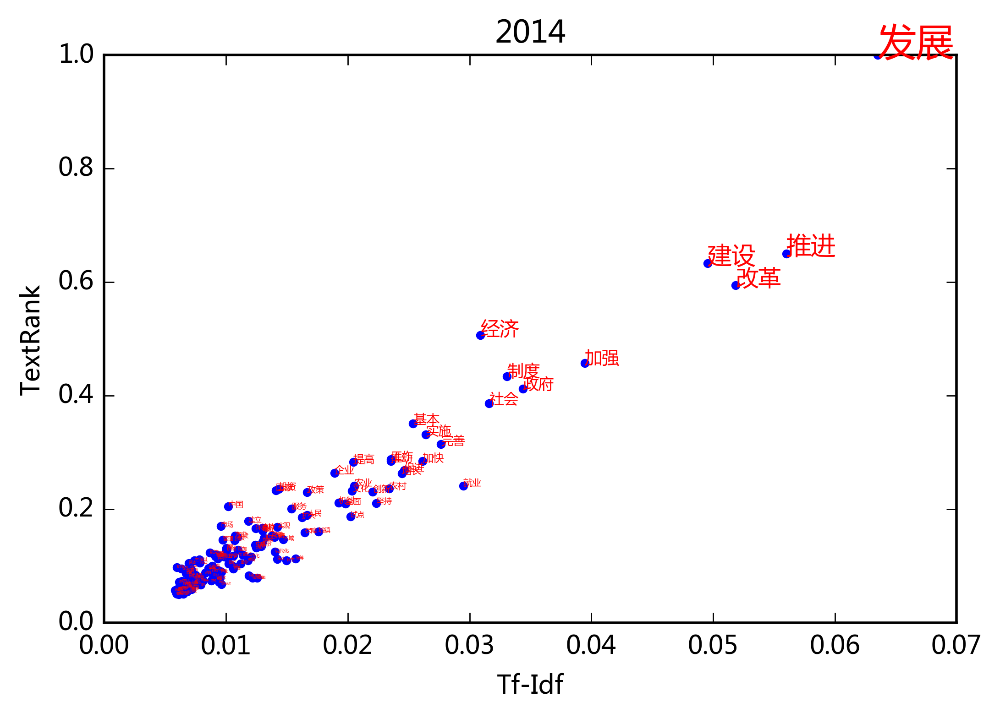

In [14]:
keywords(3)

># 4.词云

In [17]:
def wordcloudplot(txt, year):
    wordcloud = WordCloud(font_path='C:/Program Files/cjc2016/data/msyh.ttf').generate(txt)
    # Open a plot of the generated image.
    plt.imshow(wordcloud)
    plt.title(year)
    plt.axis("off")
    #plt.show()

### 基于tfidf过滤的词云

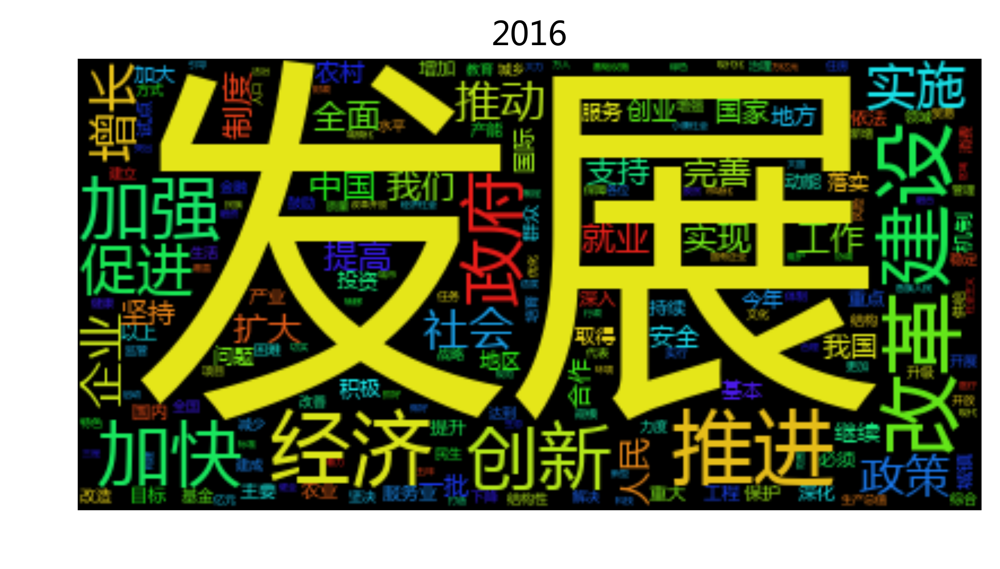

In [21]:
txt = reports[-1]
tfidf200= jieba.analyse.extract_tags(txt, topK=200, withWeight=False)
seg_list = jieba.cut(txt, cut_all=False)
seg_list = [i for i in seg_list if i in tfidf200]
txt200 = r' '.join(seg_list)
wordcloudplot(txt200, txt[:4]) 

In [22]:
wordfreq = defaultdict(int)
for i in seg_list:
    wordfreq[i] +=1
wordfreq = [[i, wordfreq[i]] for i in wordfreq]

wordfreq.sort(key= lambda x:x[1], reverse = True )
print u"、 ".join([ i[0] + u'（' + str(i[1]) +u'）' for i in wordfreq ])

发展（139）、 建设（68）、 经济（67）、 改革（62）、 推进（62）、 创新（56）、 加快（42）、 加强（41）、 政府（40）、 促进（37）、 实施（36）、 增长（36）、 企业（35）、 政策（35）、 推动（34）、 社会（34）、 中国（32）、 提高（31）、 我们（30）、 全面（28）、 完善（27）、 扩大（26）、 工作（26）、 制度（26）、 实现（25）、 就业（24）、 人民（24）、 支持（24）、 坚持（23）、 我国（22）、 国家（21）、 一批（21）、 创业（21）、 安全（21）、 农村（20）、 合作（20）、 国际（20）、 继续（19）、 地方（19）、 服务（19）、 投资（19）、 积极（19）、 取得（19）、 基本（18）、 落实（18）、 加大（18）、 机制（18）、 今年（18）、 地区（17）、 问题（17）、 农业（17）、 深化（17）、 主要（17）、 国内（16）、 工程（16）、 试点（16）、 目标（16）、 以上（16）、 城镇（15）、 保护（15）、 深入（15）、 重大（15）、 服务业（14）、 必须（14）、 增加（14）、 群众（14）、 动能（14）、 持续（14）、 依法（14）、 重点（14）、 产业（13）、 提升（13）、 改造（13）、 基金（13）、 金融（13）、 产能（13）、 供给（13）、 战略（13）、 稳定（13）、 力度（13）、 减少（13）、 领域（13）、 结构性（13）、 民生（13）、 结构（12）、 建成（12）、 教育（12）、 解决（12）、 增强（12）、 水平（12）、 消费（12）、 生活（12）、 升级（12）、 鼓励（12）、 方式（12）、 建立（12）、 改善（12）、 困难（11）、 全国（11）、 培育（11）、 开展（11）、 坚决（11）、 达到（11）、 城乡（11）、 综合（11）、 下降（10）、 生产总值（10）、 健康（10）、 特色（10）、 优化（10）、 住房（10）、 规模（10）、 风险（10）、 任务（10）、 管理（10）、 项目（10）、 质量（10）、 保障（10）、 更加（10）、 实行（10）、 亿元（10）、 新增（10）、 治理（10）、 代表（10）、 监管（

### 基于停用词过滤的词云

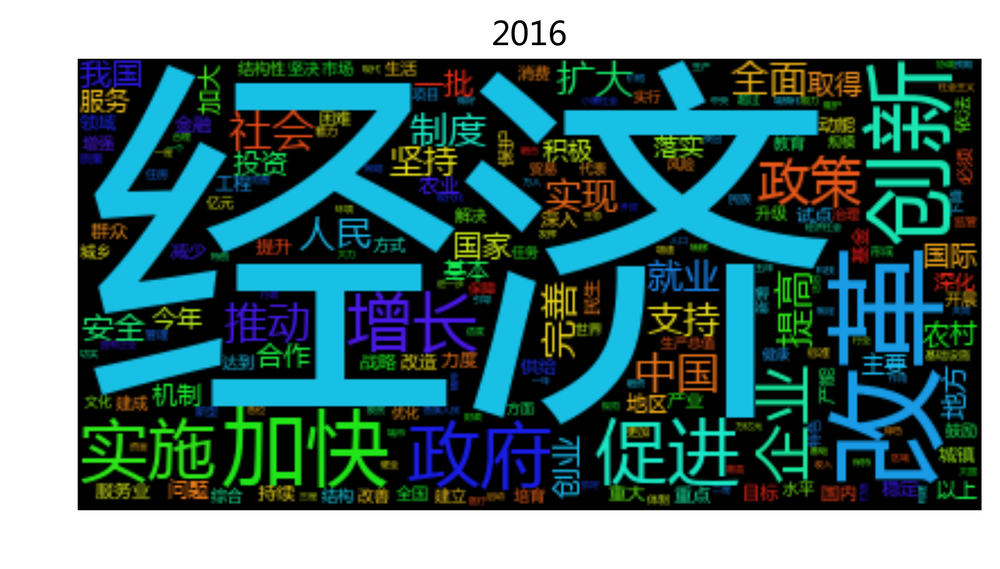

In [23]:
#jieba.add_word('股灾', freq=100, tag=None) 

txt = reports[-1]
seg_list = jieba.cut(txt, cut_all=False)
seg_list = [i for i in seg_list if i not in stopwords]
txt = r' '.join(seg_list)
wordcloudplot(txt, txt[:4]) 
#file_path = '/Users/chengjun/GitHub/cjc2016/figures/wordcloud-' + txt[:4] + '.png'
#plt.savefig(file_path,dpi = 300, bbox_inches="tight",transparent = True)

In [ ]:
#jieba.add_word('股灾', freq=100, tag=None) 

for txt in reports:
    seg_list = jieba.cut(txt, cut_all=False)
    seg_list = [i for i in seg_list if i not in stopwords]
    txt = r' '.join(seg_list)
    wordcloudplot(txt, txt[:4]) 
    file_path = 'C:/Program Files/cjc2016/figure/wordcloud-' + txt[:4] + '.png'
    plt.savefig(file_path,dpi = 400, bbox_inches="tight",transparent = True)


># 5. 词向量的时间序列

In [24]:
import jieba.analyse

wordset = []
for txt in reports:
    top20= jieba.analyse.textrank(txt, topK=200, withWeight=False)
    for w in top20:
        if w not in wordset:
            wordset.append(w)


In [25]:
len(wordset)

1292

In [26]:
print ' '.join(wordset)

国家 人民 工业 发展 建设 工作 生产 美国 企业 经济 计划 社会主义 中国 进行 全国 技术 亚洲 集团 需要 问题 农业 方面 完成 建立 台湾 生活 事业 没有 改造 应当 资本主义 增加 关系 组织 保证 会议 侵略 不能 注意 加强 战争 提高 社会 文化 继续 政府 现代化 能够 日内瓦 世界 东南亚 运动 起来 参加 苏联 少数民族 协议 管理 浪费 实行 群众 机关 采取 解决 得到 制度 现象 条约 改善 领导 资金 革命 集体 职工 任务 政策 地方 增长 斗争 商业 工作人员 合作 情况 农民 规定 恢复 日本 卖国 法律 比重 解放 物质 实现 劳动 原则 改进 力量 城市 工程 时期 破坏 企图 朝鲜 研究 印度支那 总产值 帮助 地区 扩大 重工业 保障 合理 教育 产品 财政 作用 依靠 才能 民主 成为 巩固 华侨 中央 任意 培养 收购 制造厂 要求 分子 供应 权利 代表 粮食 包括 棉花 基础 推广 使用 表现 节约 国际 水平 损失 公私合营 行政 全部 宪法 防务 忽视 防洪 人才 不够 产量 思想 容许 国民经济 还有 等于 准备 加以 时候 希望 干涉 大家 商品 民族 经验 大陆 适应 胜利 不顾 领土 五年计划 克服 中华人民共和国 设备 工业化 决定 达到 活动 国营商业 势力 缺点 加紧 有关 联系 支持 已有 满足 指导 开展 发挥 市场 独立 铁路 昌都地区 保卫 部门 正义 知识分子 应该 可能 投资 增产 单位 设计 工人 条件 制造 形式 建成 原料 手工业 工厂 开始 办法 资本家 规模 新建 农村 例如 过渡时期 认为 工业生产 干部 大量 职员 施工 减少 学习 土地 帝国主义 利用 援助 数量 限额 人员 指标 厂矿 加工 汽车 种类 速度 工人阶级 原有 学校 质量 科学技术 方针 政治 轻工业 错误 措施 定货 合作化 改变 经营 统治 接受 周转量 试制 改建 材料 个体 道路 工业品 面积 积极性 薯类 产值 重点 实际 建筑 促进 水利 所有制 消费品 总任务 历史 掌握 非生产性 标准 比例 预算 支出 收入 部分 执行 国营 立井 公路 项目 税收 总数 片面 数字 价格 钢材 扣除 国营企业 预计 收支 状况 兰州 拨付 货物 水库 工业部 降低 可比 过程 储备 包头 决算

In [27]:
from collections import defaultdict

data = defaultdict(dict)
years = [int(i[:4]) for i in reports]
for i in wordset:
    for year in years:
        data[i][year] = 0

In [28]:
for txt in reports:
    year = int(txt[:4])
    top1000= jieba.analyse.textrank(txt, topK=1000, withWeight=True)
    for ww in top1000:
        word, weight = ww
        if word in wordset:
            data[word][year]+= weight

In [29]:
word_weight = []
for i in data:
    word_weight.append([i, np.sum(data[i].values())])

In [30]:
word_weight.sort(key= lambda x:x[1], reverse = True )
top50 = [i[0] for i in word_weight[:50]]

In [31]:
print ' '.join(top50) 

发展 建设 经济 加强 企业 工作 改革 国家 人民 继续 社会主义 提高 社会 生产 农业 政府 制度 增加 推进 问题 促进 增长 方面 农村 管理 加快 进行 重点 坚持 全国 教育 投资 市场 工业 地区 完善 计划 实行 支持 政策 生活 中国 文化 扩大 实现 基本 改善 建立 技术 群众


In [32]:
def plotEvolution(word, color, linestyle, marker):
    cx = data[word]
    plt.plot(cx.keys(), cx.values(), color = color, 
             linestyle=linestyle, marker=marker, label= word)
    plt.legend(loc=2,fontsize=8)
    plt.ylabel(u'词语重要性')


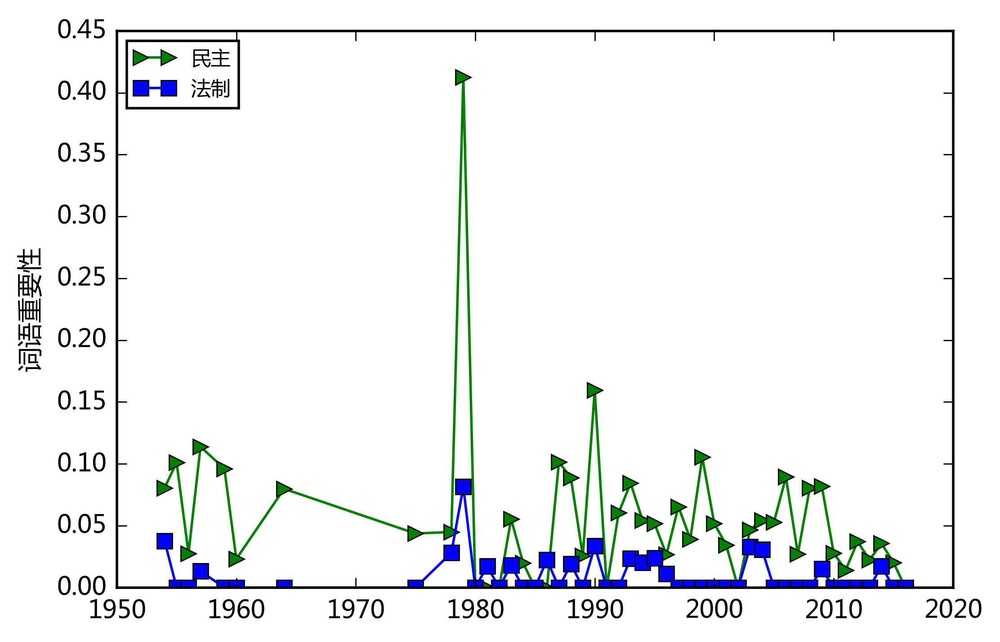

In [33]:
plotEvolution(u'民主', 'g', '-', '>')
plotEvolution(u'法制', 'b', '-', 's')

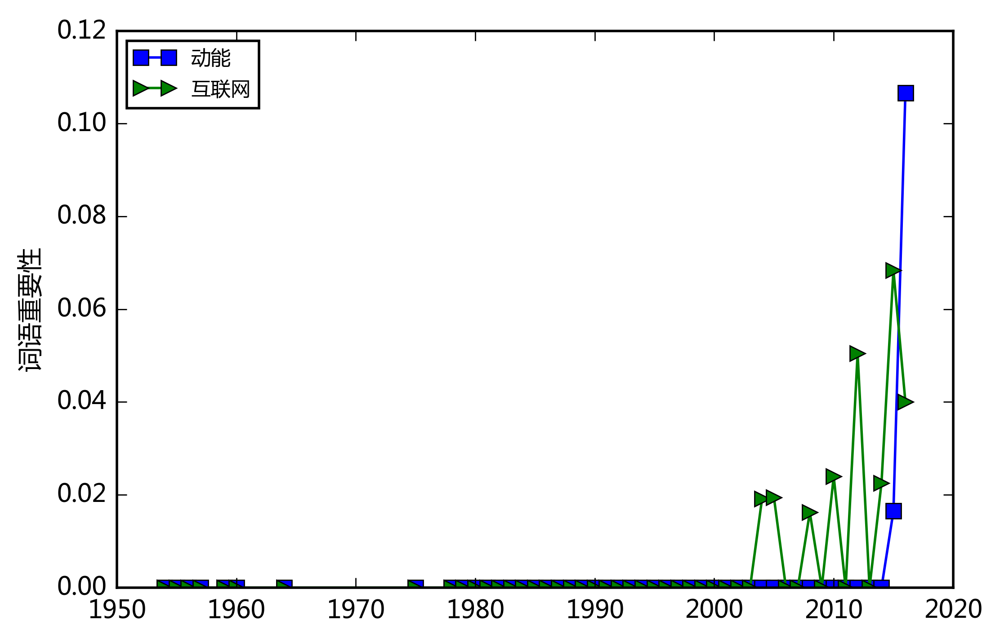

In [34]:
plotEvolution(u'动能', 'b', '-', 's')
plotEvolution(u'互联网', 'g', '-', '>')

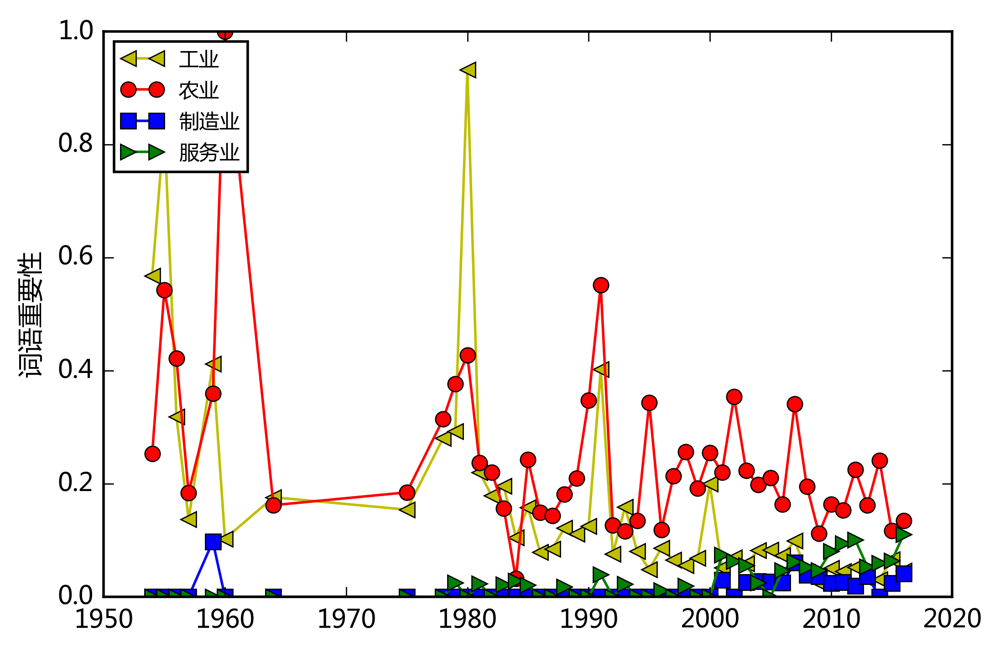

In [35]:
plotEvolution(u'工业', 'y', '-', '<')
plotEvolution(u'农业', 'r', '-', 'o')
plotEvolution(u'制造业', 'b', '-', 's')
plotEvolution(u'服务业', 'g', '-', '>')


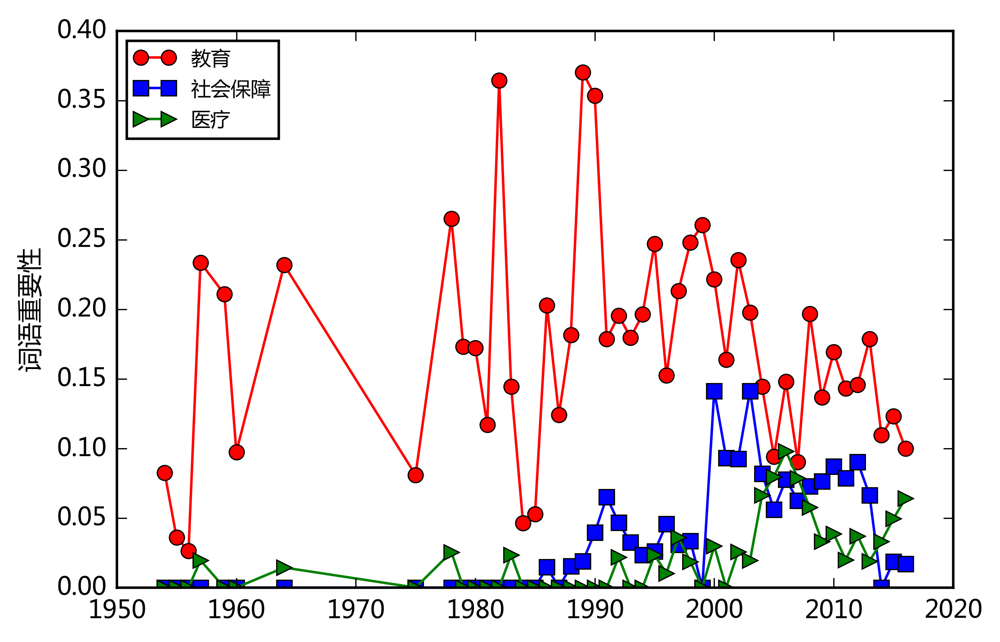

In [36]:
plotEvolution(u'教育', 'r', '-', 'o')
plotEvolution(u'社会保障', 'b', '-', 's')
plotEvolution(u'医疗', 'g', '-', '>')


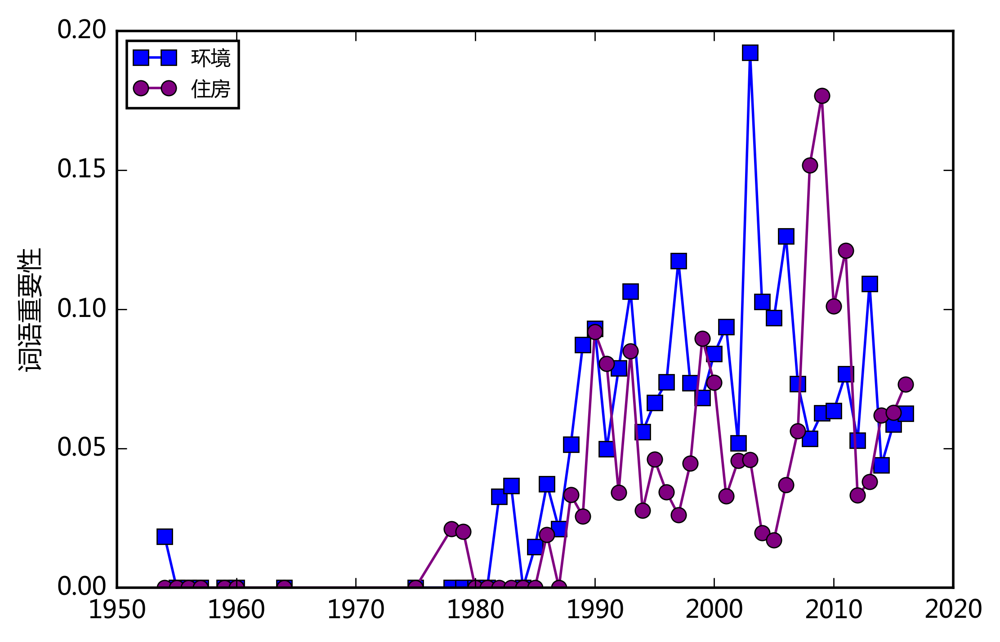

In [37]:
plotEvolution(u'环境', 'b', '-', 's')
plotEvolution(u'住房', 'purple', '-', 'o')

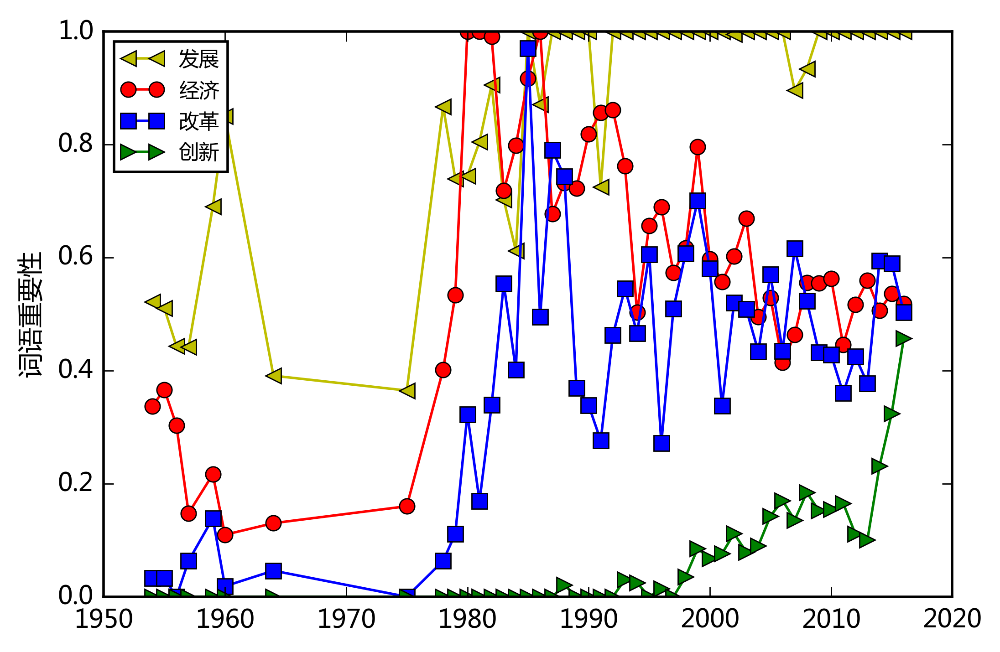

In [38]:
plotEvolution(u'发展', 'y', '-', '<')
plotEvolution(u'经济', 'r', '-', 'o')
plotEvolution(u'改革', 'b', '-', 's')
plotEvolution(u'创新', 'g', '-', '>')

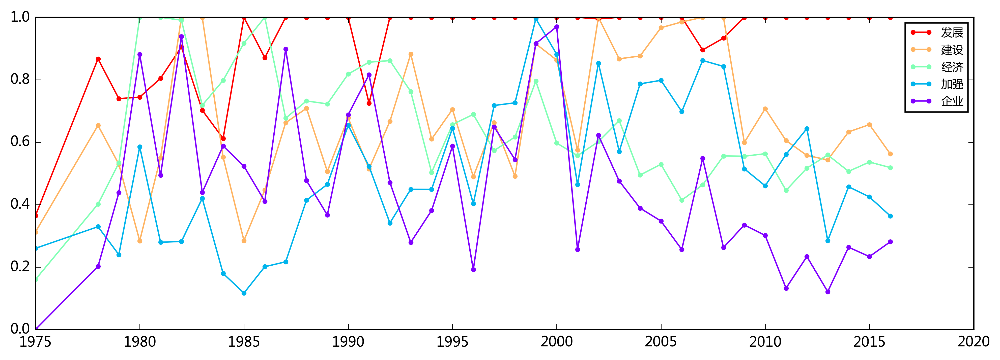

In [39]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in enumerate(top50[:5]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

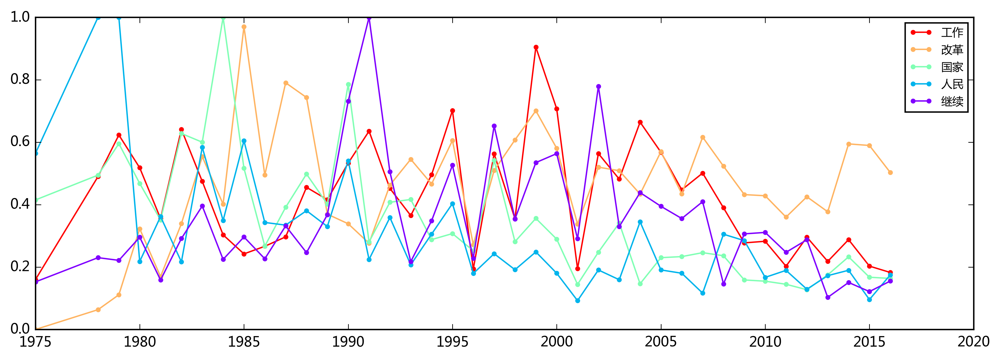

In [40]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in enumerate(top50[5:10]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

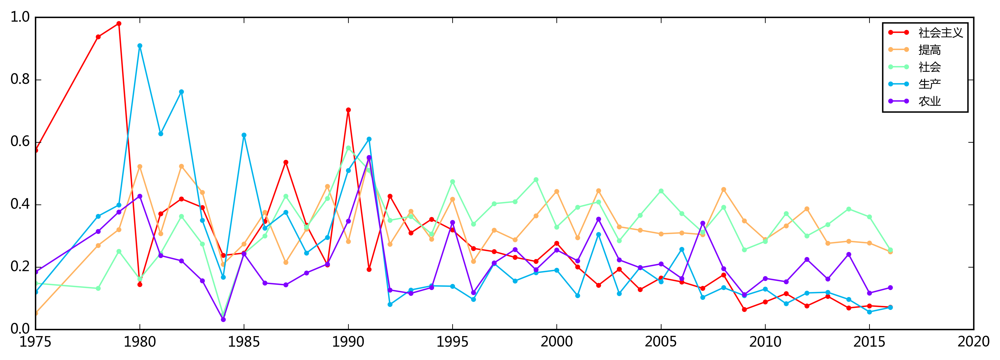

In [41]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[10:15]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

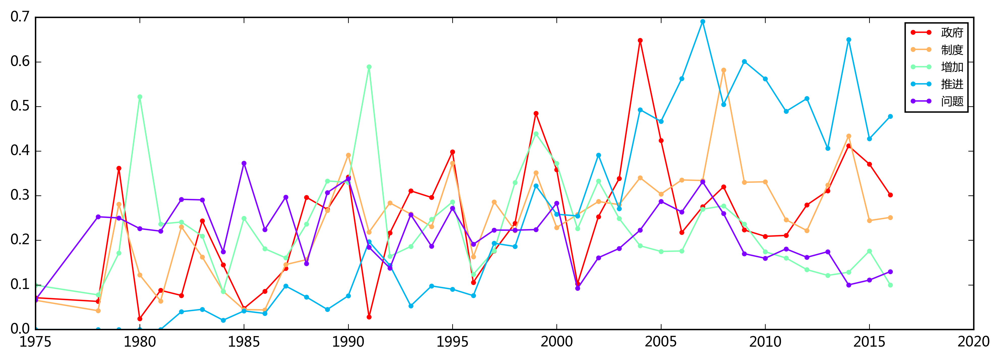

In [42]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[15:20]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

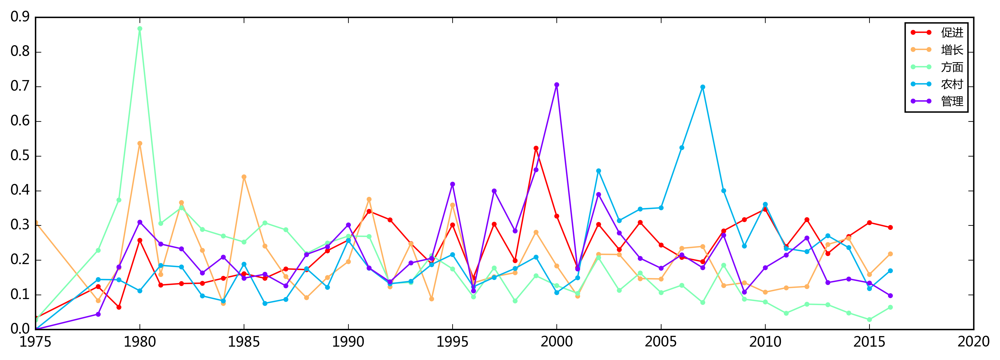

In [43]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[20:25]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

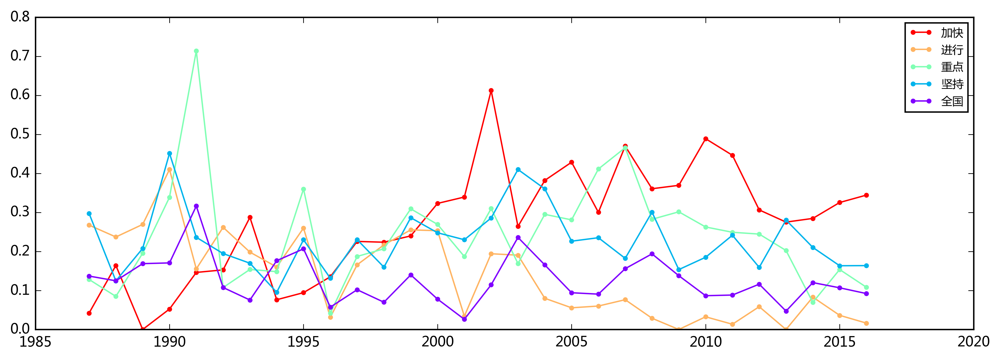

In [44]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[25:30]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

# kmeans 聚类

In [46]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
dataX = []
wordX = []
for word in top50:
    dataX.append(data[word].values()[-40:])
    wordX.append(word)
dataX = np.array(dataX)

In [47]:
dataX

array([[ 0.36469109,  0.86713375,  0.7394574 , ...,  1.        ,
         1.        ,  1.        ],
       [ 0.31221238,  0.65375465,  0.52910343, ...,  0.63299341,
         0.6563227 ,  0.56251624],
       [ 0.16004713,  0.40180724,  0.53333081, ...,  0.506591  ,
         0.53641292,  0.51870343],
       ..., 
       [ 0.09299669,  0.20133884,  0.10954325, ...,  0.178822  ,
         0.15180402,  0.1214535 ],
       [ 0.04211826,  0.11809088,  0.24676705, ...,  0.05457496,
         0.03669857,  0.03780503],
       [ 0.12809655,  0.32405048,  0.22293145, ...,  0.09914296,
         0.09119663,  0.11760352]])

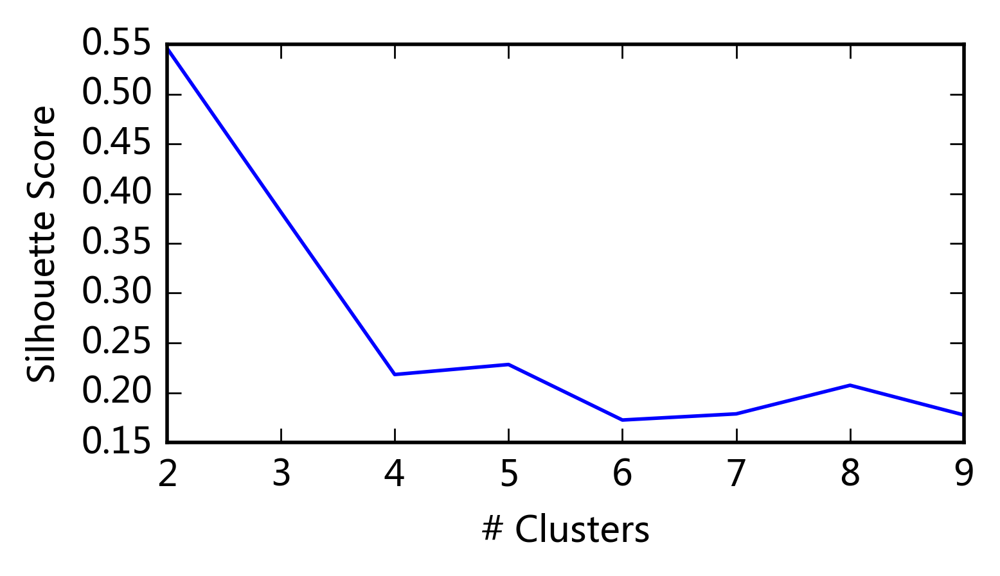

In [48]:
import numpy as np
from sklearn.cluster import KMeans
silhouette_score = []
for cluster_num in range(2, 10):
    kmeans_model = KMeans(n_clusters=cluster_num, random_state=1).fit(dataX)
    labels = kmeans_model.labels_
    sscore = metrics.silhouette_score(dataX, labels, metric='euclidean')
    silhouette_score.append(sscore)

fig = plt.figure(figsize=(4, 2),facecolor='white')    
plt.plot(range(2, 10), silhouette_score)
plt.xlabel('# Clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [49]:
# -1代表聚类效果不好，1代表聚类效果明显
kmeans_model = KMeans(n_clusters=2, random_state=1).fit(dataX)
labels = kmeans_model.labels_
labels

array([1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0])

In [50]:
print ' '.join(wordX)

发展 建设 经济 加强 企业 工作 改革 国家 人民 继续 社会主义 提高 社会 生产 农业 政府 制度 增加 推进 问题 促进 增长 方面 农村 管理 加快 进行 重点 坚持 全国 教育 投资 市场 工业 地区 完善 计划 实行 支持 政策 生活 中国 文化 扩大 实现 基本 改善 建立 技术 群众


In [51]:
print '\t'.join([wordX[index] for index in np.where(labels==0)[0]])

国家	人民	继续	社会主义	提高	社会	生产	农业	政府	制度	增加	推进	问题	促进	增长	方面	农村	管理	加快	进行	重点	坚持	全国	教育	投资	市场	工业	地区	完善	计划	实行	支持	政策	生活	中国	文化	扩大	实现	基本	改善	建立	技术	群众


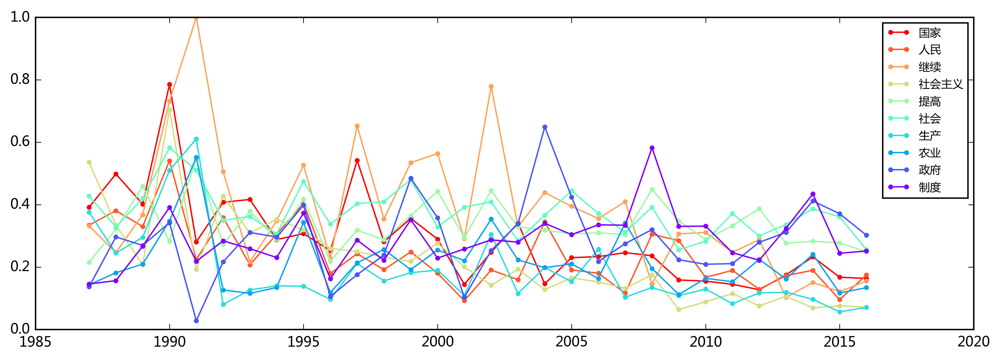

In [52]:
word_cluster1 = [wordX[index] for index in np.where(labels==0)[0]]

fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',10)

for k, word in  enumerate(word_cluster1[:10]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

In [53]:
print '\t'.join([wordX[index] for index in np.where(labels==1)[0]])

发展	建设	经济	加强	企业	工作	改革


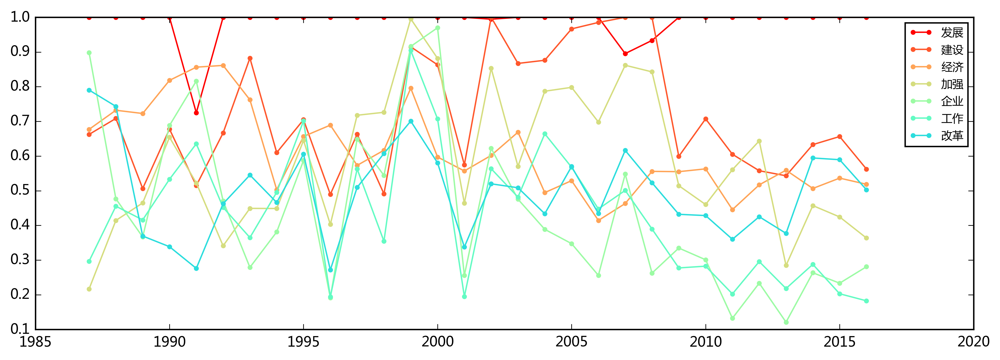

In [54]:
word_cluster2 = [wordX[index] for index in np.where(labels==1)[0]]

fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',10)

for k, word in  enumerate(word_cluster2[:10]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

# 词性标注

In [111]:
import jieba.posseg as pseg
words = pseg.cut("我爱北京天安门")
words = [str(w).split('/') for w in words]
for i in words:
    print i[0], i[1]

�� r
�� v
���� ns
�찲�� ns


# 主题模型

In [112]:
def getCorpus(data):
    processed_docs = [tokenize(doc) for doc in data]
    word_count_dict = gensim.corpora.Dictionary(processed_docs)
    print "In the corpus there are", len(word_count_dict), "unique tokens"
    word_count_dict.filter_extremes(no_below=5, no_above=0.2) # word must appear >5 times, and no more than 10% documents
    print "After filtering, in the corpus there are only", len(word_count_dict), "unique tokens"
    bag_of_words_corpus = [word_count_dict.doc2bow(pdoc) for pdoc in processed_docs]
    return bag_of_words_corpus, word_count_dict

def cleancntxt(txt, stopwords):
    tfidf1000= jieba.analyse.extract_tags(txt, topK=1000, withWeight=False)
    seg_generator = jieba.cut(txt, cut_all=False)
    seg_list = [i for i in seg_generator if i not in stopwords]
    seg_list = [i for i in seg_list if i != u' ']
    seg_list = [i for i in seg_list if i in tfidf1000]
    return(seg_list)

def getCnCorpus(data):
    processed_docs = [cleancntxt(doc) for doc in data]
    word_count_dict = gensim.corpora.Dictionary(processed_docs)
    print "In the corpus there are", len(word_count_dict), "unique tokens"
    #word_count_dict.filter_extremes(no_below=5, no_above=0.2) 
    # word must appear >5 times, and no more than 10% documents
    print "After filtering, in the corpus there are only", len(word_count_dict), "unique tokens"
    bag_of_words_corpus = [word_count_dict.doc2bow(pdoc) for pdoc in processed_docs]
    return bag_of_words_corpus, word_count_dict

def inferTopicNumber(bag_of_words_corpus, num, word_count_dict):
    lda_model = gensim.models.LdaModel(bag_of_words_corpus, num_topics=num, id2word=word_count_dict, passes=10)
    _ = lda_model.print_topics(-1) #use _ for throwaway variables.
    logperplexity = lda_model.log_perplexity(bag_of_words_corpus)
    return logperplexity

def ppnumplot(topicnum,logperplexity): #做主题数与困惑度的折线图
    plt.plot(topicnum,logperplexity,color="red",linewidth=2)
    plt.xlabel("Number of Topic")
    plt.ylabel("Perplexity")
    plt.show()  
    
# 定义一些常用的函数
def flushPrint(variable):
    if variable %10^2 == 0:
        sys.stdout.write('\r')
        sys.stdout.write('%s' % variable)
        sys.stdout.flush()
    
    
def top(data):
    for i in data:
        print i
        
def freq(data):
    dtable = defaultdict(int)
    for i in data:
        dtable[i] += 1
    return dtable

def sortdict(data):
    '''data is a dict, sorted by value'''
    return sorted(data.items(), lambda x, y: cmp(x[1], y[1]), reverse=True) 


# 对2016年政府工作报告建立主题模型

In [113]:
import urllib2
from bs4 import BeautifulSoup
import sys

url2016 = 'http://news.xinhuanet.com/fortune/2016-03/05/c_128775704.htm'
content = urllib2.urlopen(url2016).read()
soup = BeautifulSoup(content) 


In [114]:
gov_report_2016 = [s.text for s in soup('p')]
for i in gov_report_2016[:10]:print i

政府工作报告
——2016年3月5日在第十二届全国人民代表大会第四次会议上
国务院总理 李克强
各位代表：
　　现在，我代表国务院，向大会报告政府工作，请予审议，并请全国政协各位委员提出意见。
　　一、2015年工作回顾
　　过去一年，我国发展面临多重困难和严峻挑战。在以习近平同志为总书记的党中央坚强领导下，全国各族人民以坚定的信心和非凡的勇气，攻坚克难，开拓进取，经济社会发展稳中有进、稳中有好，完成了全年主要目标任务，改革开放和社会主义现代化建设取得新的重大成就。
　　——经济运行保持在合理区间。国内生产总值达到67.7万亿元，增长6.9%，在世界主要经济体中位居前列。粮食产量实现"十二连增"，居民消费价格涨幅保持较低水平。特别是就业形势总体稳定，城镇新增就业1312万人，超过全年预期目标，成为经济运行的一大亮点。
　　——结构调整取得积极进展。服务业在国内生产总值中的比重上升到50.5%，首次占据"半壁江山"。消费对经济增长的贡献率达到66.4%。高技术产业和装备制造业增速快于一般工业。单位国内生产总值能耗下降5.6%。
　　——发展新动能加快成长。创新驱动发展战略持续推进，互联网与各行业加速融合，新兴产业快速增长。大众创业、万众创新蓬勃发展，全年新登记注册企业增长21.6%，平均每天新增1.2万户。新动能对稳就业、促升级发挥了突出作用，正在推动经济社会发生深刻变革。


In [115]:
for i in gov_report_2016[:10]:print i

政府工作报告
——2016年3月5日在第十二届全国人民代表大会第四次会议上
国务院总理 李克强
各位代表：
　　现在，我代表国务院，向大会报告政府工作，请予审议，并请全国政协各位委员提出意见。
　　一、2015年工作回顾
　　过去一年，我国发展面临多重困难和严峻挑战。在以习近平同志为总书记的党中央坚强领导下，全国各族人民以坚定的信心和非凡的勇气，攻坚克难，开拓进取，经济社会发展稳中有进、稳中有好，完成了全年主要目标任务，改革开放和社会主义现代化建设取得新的重大成就。
　　——经济运行保持在合理区间。国内生产总值达到67.7万亿元，增长6.9%，在世界主要经济体中位居前列。粮食产量实现"十二连增"，居民消费价格涨幅保持较低水平。特别是就业形势总体稳定，城镇新增就业1312万人，超过全年预期目标，成为经济运行的一大亮点。
　　——结构调整取得积极进展。服务业在国内生产总值中的比重上升到50.5%，首次占据"半壁江山"。消费对经济增长的贡献率达到66.4%。高技术产业和装备制造业增速快于一般工业。单位国内生产总值能耗下降5.6%。
　　——发展新动能加快成长。创新驱动发展战略持续推进，互联网与各行业加速融合，新兴产业快速增长。大众创业、万众创新蓬勃发展，全年新登记注册企业增长21.6%，平均每天新增1.2万户。新动能对稳就业、促升级发挥了突出作用，正在推动经济社会发生深刻变革。


In [116]:
len(gov_report_2016[5:-1])

103

In [117]:
jieba.add_word(u'屠呦呦', freq=None, tag=None)
#del_word(word) 

print ' '.join(cleancntxt(u'屠呦呦获得了诺贝尔医学奖。', stopwords))

屠呦呦 获得 诺贝尔 医学奖


In [118]:
processed_docs = [cleancntxt(doc, stopwords) for doc in gov_report_2016[5:-1]]
word_count_dict = gensim.corpora.Dictionary(processed_docs)
print "In the corpus there are", len(word_count_dict), "unique tokens"
# word_count_dict.filter_extremes(no_below=5, no_above=0.2) # word must appear >5 times, and no more than 10% documents
# print "After filtering, in the corpus there are only", len(word_count_dict), "unique tokens"
bag_of_words_corpus = [word_count_dict.doc2bow(pdoc) for pdoc in processed_docs]



In the corpus there are 2622 unique tokens


In [119]:
tfidf = models.TfidfModel(bag_of_words_corpus )
corpus_tfidf = tfidf[bag_of_words_corpus ]
lda_model = gensim.models.LdaModel(corpus_tfidf, num_topics=20, id2word=word_count_dict, passes=10)

In [120]:
perplexity_list = [inferTopicNumber(bag_of_words_corpus, num, word_count_dict) for num in [5, 15, 20, 25, 30, 35, 40 ]]

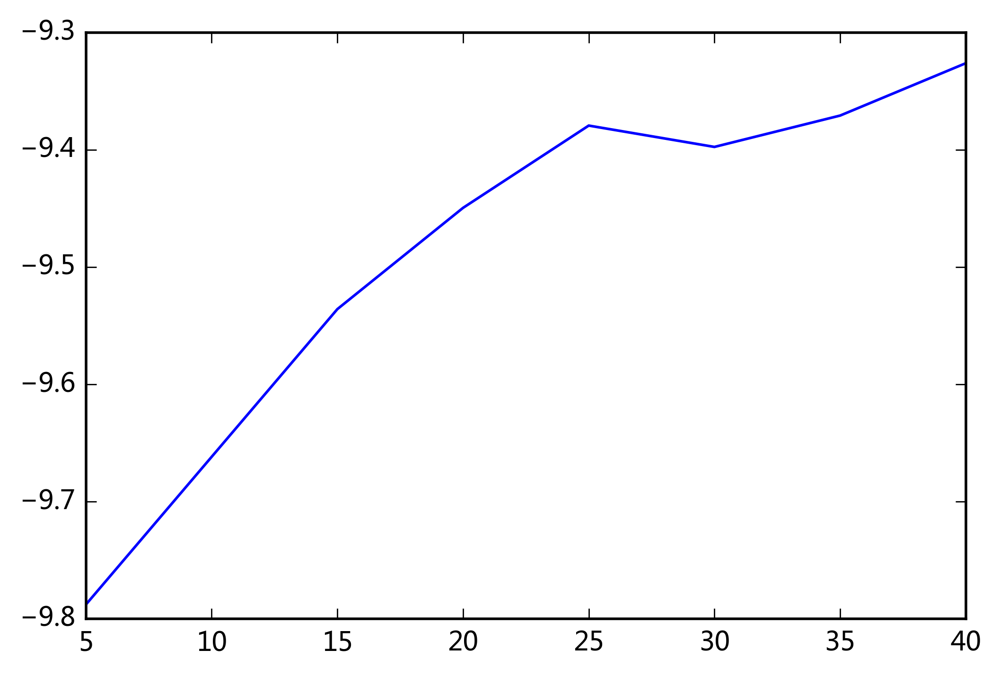

In [121]:
plt.plot([5, 15, 20, 25, 30, 35, 40], perplexity_list)

In [132]:
topictermlist = lda_model.print_topics(-1)
type(topictermlist)

list

In [131]:
top_words = [[j.split('*')[1] for j in i[1].split(' + ')] for i in topictermlist] 
for i in top_words: print " ".join(i) + '\n'

创新 经济 加快 实施 重大 促进 完善 保护 政策 社会

合作 经贸合作 强国 创新型 住房 经济 挑战 积累 注入 一带

供给 结构性 地方 激发 改革 创业 围绕 活力 投资 融资

充分发挥 谈判 协定 自贸区 财政支出 向心力 归侨 中华儿女 侨眷 侨务

环保 节能 党风廉政 居民 外商投资 存在 一些 城镇化 基础设施 问题

港澳 规划 海洋 第十三个 国民经济 自贸 制定 香港 五年 地区

需求 就业 八个 做好 扩大 今年 重点 合作 方面 教育

国有企业 亿多 下降 生产总值 国有资产 燃煤 住房 过程 国内 结构调整

以上 生产总值 万元 十二五 国内 6.5 城镇 新兴产业 12 2020

两岸 支付 存款 减少 项目 定价 和平 转移 交流 地方

民生 领导人 竞争 合作 对外开放 金融 论坛 意识 干事 峰会

各位 代表 以下 一年 主要 审批 农业 高效 事项 取消

宗教 动能 基本方针 信教 宗教事务 宗教界 技术 大气 生态环境 人士

脱贫 财政赤字 扶贫 安排 亿元 突出 协调 地方 债券 明确

2016 民族 农村 重点 世界反法西斯战争 调控 各国 表示 诚挚 感谢

就业 经济运行 全年 更加 必胜信心 光明 如期 展望 美好 将会

接受 大国 利益 及其 法治 外交 政府 自觉 合作 和平

军队 考虑 政府 6.5 救助 预期 养老金 国防 城乡 有利于

回顾 2015 非公有制 城镇化 产能 服务业 万公里 改善 双赢 下决心

安全 随机 监管 行政 执法 清单 生产 一岗双责 应急 失职



In [134]:
top_words_shares = [[j.split('*')[0] for j in i[1].split(' + ')] for i in topictermlist] 
top_words_shares = [map(float, i) for i in top_words_shares]
def weightvalue(x):
    return (x - np.min(top_words_shares))*40/(np.max(top_words_shares) -np.min(top_words_shares)) + 10
 
top_words_shares = [map(weightvalue, i) for i in top_words_shares]  

def plotTopics(mintopics, maxtopics):
    num_top_words = 10
    plt.rcParams['figure.figsize'] = (10.0, 4.0)  
    n = 0
    for t in range(mintopics , maxtopics):
        plt.subplot(2, 15, n + 1)  # plot numbering starts with 1
        plt.ylim(0, num_top_words)  # stretch the y-axis to accommodate the words
        plt.xticks([])  # remove x-axis markings ('ticks')
        plt.yticks([]) # remove y-axis markings ('ticks')
        plt.title(u'主题 #{}'.format(t+1), size = 5)
        words = top_words[t][0:num_top_words ]
        words_shares = top_words_shares[t][0:num_top_words ]
        for i, (word, share) in enumerate(zip(words, words_shares)):
            plt.text(0.05, num_top_words-i-0.9, word, fontsize= np.log(share*10))
        n += 1

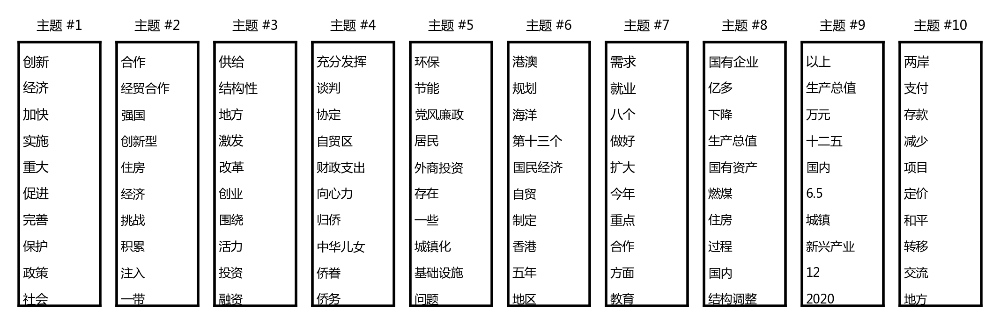

In [135]:
plotTopics(0, 10)


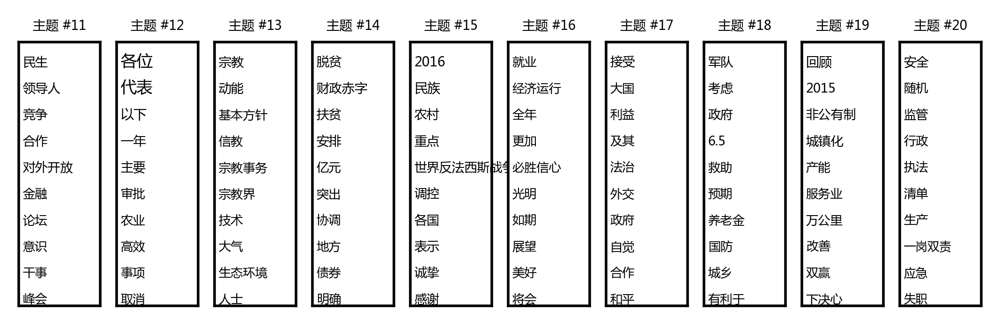

In [136]:
plotTopics(10, 20)